# 13 – CNN-Based Music Recommendation

In this notebook, we reuse the final CNN classifier as a feature extractor for content-based music recommendation.

Instead of comparing songs using handcrafted MFCC features, we compare learned CNN embeddings extracted from Mel-spectrograms.

## Project Context

In Week 8, we built a first content-based recommendation system using MFCC features.

In Week 9, we observed that MFCC similarity does not always align well with genre labels or musical intuition.

This notebook revisits the recommendation task using a more powerful representation: learned embeddings from the final CNN.

This turns the trained classifier into a reusable audio feature extractor.

## Recommendation Pipeline

The complete recommendation pipeline works as follows:

| Step | Description |
|---|---|
| 1 | Load audio file |
| 2 | Convert audio to Mel-spectrogram |
| 3 | Normalize using training statistics |
| 4 | Pass spectrogram through the CNN |
| 5 | Extract internal embedding vector |
| 6 | Compare embeddings using cosine similarity |
| 7 | Return most similar songs |

In [5]:
import numpy as np
import pandas as pd
import librosa
from pathlib import Path
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA

from IPython.display import Audio, display

## Loading the Final CNN

The final CNN trained in Week 12 is loaded together with its preprocessing parameters.

This is important because recommendation embeddings must be extracted using exactly the same preprocessing steps that were used during training.

In [6]:
data_path = Path("../data/raw/gtzan/Data/genres_original")
model_path = Path("../results/models/final_cnn_genre_classifier_augmented.pth")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cpu


In [7]:
class FinalCNN(nn.Module):

    def __init__(self, num_classes):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.AdaptiveAvgPool2d((4, 4))
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 4 * 4, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

In [8]:
checkpoint = torch.load(
    model_path,
    map_location=device,
    weights_only=False
)

classes = checkpoint["classes"]
X_mean = checkpoint["x_mean"]
X_std = checkpoint["x_std"]
n_mels = checkpoint["n_mels"]
target_frames = checkpoint["target_frames"]
sample_rate = checkpoint["sample_rate"]

model = FinalCNN(num_classes=len(classes)).to(device)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

print("Loaded model:", model_path)
print("Classes:", classes)

Loaded model: ../results/models/final_cnn_genre_classifier_augmented.pth
Classes: ['blues' 'classical' 'country' 'disco' 'hiphop' 'jazz' 'metal' 'pop'
 'reggae' 'rock']


## Feature Extraction Using the CNN

Although the CNN was trained as a genre classifier, the final prediction itself is not used for recommendation.

Instead, the activation of the penultimate fully connected layer is extracted.

This vector, commonly referred to as an embedding, summarizes the musical characteristics learned by the CNN during training and serves as a compact numerical representation of each song.

In [9]:
def compute_mel_spectrogram(file_path, sr=22050, n_mels=128, target_frames=130):
    y, sr = librosa.load(file_path, sr=sr, mono=True)

    mel = librosa.feature.melspectrogram(
        y=y,
        sr=sr,
        n_mels=n_mels
    )

    mel_db = librosa.power_to_db(mel, ref=np.max)

    if mel_db.shape[1] >= target_frames:
        mel_db = mel_db[:, :target_frames]
    else:
        pad_width = target_frames - mel_db.shape[1]
        mel_db = np.pad(mel_db, ((0, 0), (0, pad_width)), mode="constant")

    return mel_db

## Building the Song Embedding Database

Every song in the GTZAN dataset is passed through the trained CNN.

For each song, a fixed-length embedding vector is generated and stored together with its filename and genre label.

These embeddings form the database that is later searched for similar songs.

In [10]:
def extract_embedding(file_path):
    mel = compute_mel_spectrogram(
        file_path,
        sr=sample_rate,
        n_mels=n_mels,
        target_frames=target_frames
    )

    mel = (mel - X_mean) / X_std
    mel = mel[np.newaxis, np.newaxis, :, :]

    input_tensor = torch.tensor(mel, dtype=torch.float32).to(device)

    model.eval()

    with torch.no_grad():
        x = model.features(input_tensor)
        x = torch.flatten(x, start_dim=1)

        x = model.classifier[1](x)  # Linear: 2048 -> 256
        x = model.classifier[2](x)  # ReLU

    return x.cpu().numpy()[0]

The classifier output is not used directly.

Instead, the embedding before the final classification layer is used as a learned audio representation.

This embedding contains information the CNN considered useful for distinguishing musical genres.

In [11]:
song_paths = []
song_names = []
song_genres = []
embeddings = []
skipped_files = []

for genre_path in sorted(data_path.iterdir()):
    if not genre_path.is_dir():
        continue

    genre = genre_path.name
    files = sorted(genre_path.glob("*.wav"))

    print(f"Processing {genre}: {len(files)} files")

    for file in files:
        try:
            embedding = extract_embedding(file)

            embeddings.append(embedding)
            song_paths.append(file)
            song_names.append(file.name)
            song_genres.append(genre)

        except Exception as e:
            skipped_files.append(file)
            print("Skipped:", file.name, "|", e)

embeddings = np.array(embeddings)

print("Embeddings shape:", embeddings.shape)
print("Songs:", len(song_names))
print("Skipped files:", len(skipped_files))

Processing blues: 100 files
Processing classical: 100 files
Processing country: 100 files
Processing disco: 100 files
Processing hiphop: 100 files
Processing jazz: 100 files


/tmp/ipykernel_1293/4141367547.py:2: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=sr, mono=True)
/home/richard/Projects/Music-Genre-Classification-with-CNNs-and-Audio-Based-Song-Recommendation/.venv/lib/python3.12/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Skipped: jazz.00054.wav | 
Processing metal: 100 files
Processing pop: 100 files
Processing reggae: 100 files
Processing rock: 100 files
Embeddings shape: (999, 256)
Songs: 999
Skipped files: 1


In [12]:
song_database = pd.DataFrame({
    "song_name": song_names,
    "genre": song_genres,
    "path": song_paths
})

song_database.head()

,song_name,genre,path
0,blues.00000.wav,blues,../data/raw/gtzan/Data/genres_original/blues/b...
1,blues.00001.wav,blues,../data/raw/gtzan/Data/genres_original/blues/b...
2,blues.00002.wav,blues,../data/raw/gtzan/Data/genres_original/blues/b...
3,blues.00003.wav,blues,../data/raw/gtzan/Data/genres_original/blues/b...
4,blues.00004.wav,blues,../data/raw/gtzan/Data/genres_original/blues/b...


In [13]:
from pathlib import Path

embedding_dir = Path("../results/embeddings")
embedding_dir.mkdir(parents=True, exist_ok=True)

embedding_path = embedding_dir / "song_embeddings.npz"

In [14]:
import numpy as np

np.savez_compressed(
    embedding_path,
    embeddings=embeddings,
    song_names=np.array(song_names),
    song_genres=np.array(song_genres),
    song_paths=np.array([str(path) for path in song_paths])
)

print("Saved embeddings to:", embedding_path)
print("Embeddings shape:", embeddings.shape)
print("Songs:", len(song_names))

Saved embeddings to: ../results/embeddings/song_embeddings.npz
Embeddings shape: (999, 256)
Songs: 999


## Measuring Similarity in Embedding Space

Once every song has been converted into a CNN embedding, songs can be compared numerically.

Songs with similar embeddings are assumed to share acoustic or musical characteristics learned by the CNN.

In [12]:
similarity_matrix = cosine_similarity(embeddings)

print("Similarity matrix shape:", similarity_matrix.shape)

Similarity matrix shape: (999, 999)


## Retrieving Similar Songs

Given a query song, its embedding is compared against all other songs contained in the database.

The songs with the highest cosine similarity are returned as recommendations.

Unlike the genre classifier, this approach does not require the recommended songs to belong to the same genre. Songs from different genres may still be recommended if the CNN considers them acoustically similar.

In [13]:
def recommend_songs(song_index, top_n=5):
    similarities = similarity_matrix[song_index]
    sorted_indices = np.argsort(similarities)[::-1]

    recommendations = []

    for idx in sorted_indices:
        if idx == song_index:
            continue

        recommendations.append({
            "rank": len(recommendations) + 1,
            "song_name": song_names[idx],
            "genre": song_genres[idx],
            "similarity": similarities[idx],
            "path": song_paths[idx]
        })

        if len(recommendations) == top_n:
            break

    return pd.DataFrame(recommendations)

## Recommendation Example

The following example demonstrates the complete recommendation pipeline.

A single query song is selected and passed through the CNN.

Its embedding is compared with all other songs, and the five most similar songs are returned together with their similarity scores.

In [14]:
selected_song_index = 0

print("Selected song:")
display(song_database.iloc[selected_song_index][["song_name", "genre"]])

recommend_songs(selected_song_index, top_n=5)

Selected song:


song_name    blues.00000.wav
genre                  blues
Name: 0, dtype: object

,rank,song_name,genre,similarity,path
0,1,jazz.00038.wav,jazz,0.923308,../data/raw/gtzan/Data/genres_original/jazz/ja...
1,2,jazz.00029.wav,jazz,0.908624,../data/raw/gtzan/Data/genres_original/jazz/ja...
2,3,jazz.00047.wav,jazz,0.908242,../data/raw/gtzan/Data/genres_original/jazz/ja...
3,4,blues.00058.wav,blues,0.906124,../data/raw/gtzan/Data/genres_original/blues/b...
4,5,blues.00050.wav,blues,0.902363,../data/raw/gtzan/Data/genres_original/blues/b...


## Listening Evaluation

Numerical similarity scores alone cannot fully describe the quality of a recommendation system.

Therefore, the query song and its recommended songs can be played directly.

This qualitative evaluation makes it possible to assess whether the recommended songs are perceived as musically similar by a human listener.

This manual listening step is important because recommendation quality cannot be fully evaluated with accuracy alone.

A recommendation can be numerically similar but still feel musically surprising or unintuitive to a listener.

In [15]:
def play_recommendations(song_index, top_n=5):
    print("Selected song:")
    print(song_database.iloc[song_index][["song_name", "genre"]])
    display(Audio(str(song_database.iloc[song_index]["path"])))

    recommendations = recommend_songs(song_index, top_n=top_n)

    print("\nRecommended songs:")
    display(recommendations[["rank", "song_name", "genre", "similarity"]])

    for _, row in recommendations.iterrows():
        print(
            f'{row["rank"]}. {row["song_name"]} | '
            f'Genre: {row["genre"]} | '
            f'Similarity: {row["similarity"]:.3f}'
        )
        display(Audio(str(row["path"])))

In [17]:
play_recommendations(song_index=0, top_n=5)

Selected song:
song_name    blues.00000.wav
genre                  blues
Name: 0, dtype: object



Recommended songs:


,rank,song_name,genre,similarity
0,1,jazz.00038.wav,jazz,0.923308
1,2,jazz.00029.wav,jazz,0.908624
2,3,jazz.00047.wav,jazz,0.908242
3,4,blues.00058.wav,blues,0.906124
4,5,blues.00050.wav,blues,0.902363


1. jazz.00038.wav | Genre: jazz | Similarity: 0.923


2. jazz.00029.wav | Genre: jazz | Similarity: 0.909


3. jazz.00047.wav | Genre: jazz | Similarity: 0.908


4. blues.00058.wav | Genre: blues | Similarity: 0.906


5. blues.00050.wav | Genre: blues | Similarity: 0.902


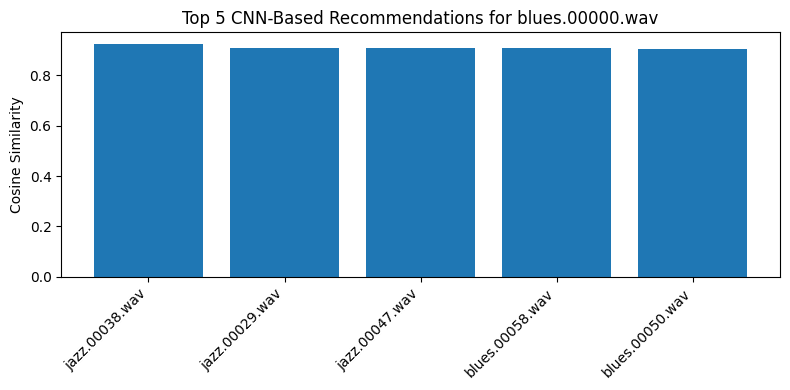

In [18]:
recommendations = recommend_songs(selected_song_index, top_n=5)

plt.figure(figsize=(8,4))

plt.bar(
    recommendations["song_name"],
    recommendations["similarity"]
)

plt.title(f"Top 5 CNN-Based Recommendations for {song_names[selected_song_index]}")
plt.ylabel("Cosine Similarity")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

In [19]:
for genre in classes:
    example_idx = song_database[song_database["genre"] == genre].index[0]

    print("=" * 70)
    print("Selected:")
    print(song_database.iloc[example_idx][["song_name", "genre"]])

    display(
        recommend_songs(example_idx, top_n=5)[
            ["rank", "song_name", "genre", "similarity"]
        ]
    )

Selected:
song_name    blues.00000.wav
genre                  blues
Name: 0, dtype: object


,rank,song_name,genre,similarity
0,1,jazz.00038.wav,jazz,0.923308
1,2,jazz.00029.wav,jazz,0.908624
2,3,jazz.00047.wav,jazz,0.908242
3,4,blues.00058.wav,blues,0.906124
4,5,blues.00050.wav,blues,0.902363


Selected:
song_name    classical.00000.wav
genre                  classical
Name: 100, dtype: object


,rank,song_name,genre,similarity
0,1,classical.00012.wav,classical,0.994036
1,2,classical.00024.wav,classical,0.989535
2,3,classical.00022.wav,classical,0.987847
3,4,classical.00076.wav,classical,0.984807
4,5,classical.00042.wav,classical,0.983768


Selected:
song_name    country.00000.wav
genre                  country
Name: 200, dtype: object


,rank,song_name,genre,similarity
0,1,country.00008.wav,country,0.959266
1,2,country.00005.wav,country,0.944311
2,3,country.00044.wav,country,0.934133
3,4,country.00007.wav,country,0.923760
4,5,country.00006.wav,country,0.918961


Selected:
song_name    disco.00000.wav
genre                  disco
Name: 300, dtype: object


,rank,song_name,genre,similarity
0,1,disco.00001.wav,disco,0.918377
1,2,disco.00017.wav,disco,0.918038
2,3,disco.00007.wav,disco,0.916530
3,4,disco.00025.wav,disco,0.910563
4,5,country.00039.wav,country,0.906716


Selected:
song_name    hiphop.00000.wav
genre                  hiphop
Name: 400, dtype: object


,rank,song_name,genre,similarity
0,1,hiphop.00015.wav,hiphop,0.933154
1,2,hiphop.00008.wav,hiphop,0.929693
2,3,hiphop.00086.wav,hiphop,0.928719
3,4,hiphop.00018.wav,hiphop,0.921068
4,5,metal.00070.wav,metal,0.918426


Selected:
song_name    jazz.00000.wav
genre                  jazz
Name: 500, dtype: object


,rank,song_name,genre,similarity
0,1,classical.00086.wav,classical,0.963614
1,2,classical.00088.wav,classical,0.945666
2,3,classical.00030.wav,classical,0.944152
3,4,classical.00097.wav,classical,0.943069
4,5,classical.00014.wav,classical,0.931958


Selected:
song_name    metal.00000.wav
genre                  metal
Name: 599, dtype: object


,rank,song_name,genre,similarity
0,1,metal.00024.wav,metal,0.986787
1,2,metal.00045.wav,metal,0.986707
2,3,metal.00066.wav,metal,0.986707
3,4,metal.00014.wav,metal,0.985142
4,5,metal.00015.wav,metal,0.983996


Selected:
song_name    pop.00000.wav
genre                  pop
Name: 699, dtype: object


,rank,song_name,genre,similarity
0,1,pop.00075.wav,pop,0.973844
1,2,pop.00029.wav,pop,0.969376
2,3,pop.00018.wav,pop,0.966404
3,4,pop.00022.wav,pop,0.964144
4,5,pop.00024.wav,pop,0.963204


Selected:
song_name    reggae.00000.wav
genre                  reggae
Name: 799, dtype: object


,rank,song_name,genre,similarity
0,1,reggae.00017.wav,reggae,0.962482
1,2,reggae.00024.wav,reggae,0.959364
2,3,reggae.00007.wav,reggae,0.923947
3,4,reggae.00026.wav,reggae,0.918997
4,5,reggae.00068.wav,reggae,0.918761


Selected:
song_name    rock.00000.wav
genre                  rock
Name: 899, dtype: object


,rank,song_name,genre,similarity
0,1,rock.00026.wav,rock,0.937923
1,2,rock.00025.wav,rock,0.928870
2,3,metal.00037.wav,metal,0.917218
3,4,rock.00027.wav,rock,0.911856
4,5,metal.00032.wav,metal,0.904732


## Qualitative Evaluation

Besides the quantitative evaluation, several recommendation examples were inspected manually.

For the query song `rock.00000.wav`, the recommendation system returned multiple songs from the same musical style, including two songs by Queen and another classic rock title by the Beach Boys. Likewise, recommended metal songs exhibited stylistic similarities comparable to bands such as Iron Maiden.

Although this qualitative evaluation cannot be considered a rigorous benchmark, it provides evidence that the learned CNN embeddings capture meaningful musical characteristics beyond simple genre labels.

## Visualizing the Learned Embedding Space

The learned embedding vectors are projected into two dimensions using Principal Component Analysis (PCA).

Although this projection cannot preserve all information contained in the high-dimensional embedding space, it provides an intuitive visualization of how the CNN organizes different musical genres.

Songs that appear close together in the plot have similar learned feature representations.

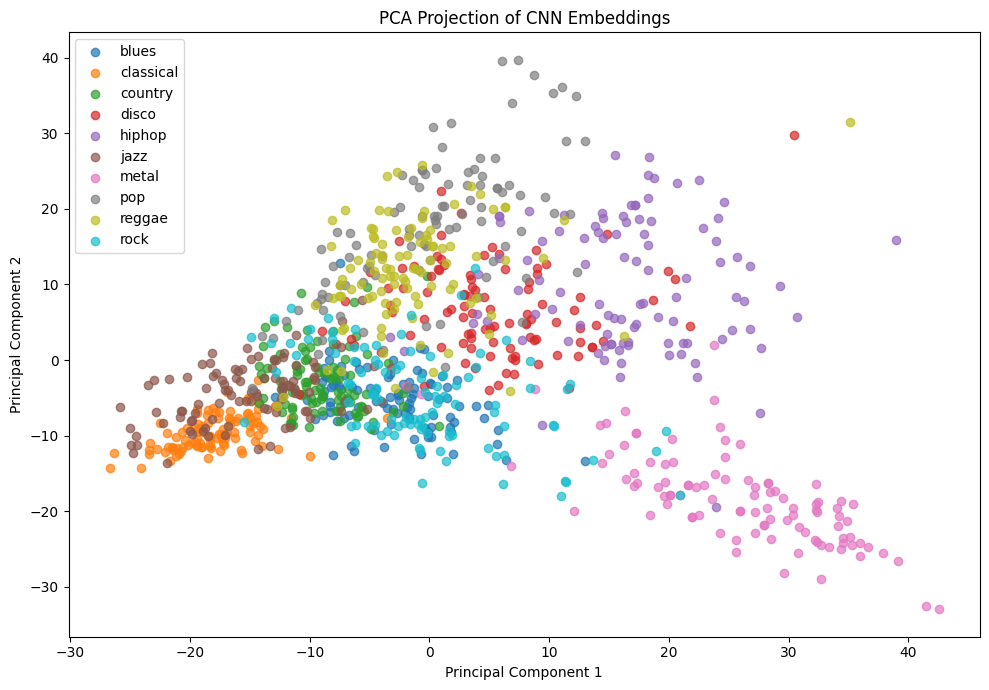

In [20]:
pca = PCA(n_components=2)
projection = pca.fit_transform(embeddings)

plt.figure(figsize=(10,7))

for genre in np.unique(song_genres):
    indices = np.array(song_genres) == genre

    plt.scatter(
        projection[indices, 0],
        projection[indices, 1],
        label=genre,
        alpha=0.7
    )

plt.title("PCA Projection of CNN Embeddings")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()

plt.tight_layout()
plt.show()

## Embedding Space Interpretation

The PCA projection shows that the CNN embeddings form meaningful musical neighborhoods.

Genres are not perfectly separated, but they often appear in coherent regions.

This is useful for recommendation because the goal is not only to reproduce genre labels, but to identify songs with similar acoustic characteristics.

## Why CNN Embeddings Instead of MFCC Features?

Earlier notebooks used handcrafted audio descriptors, primarily MFCCs, to compare songs.

MFCCs are highly effective at describing the timbral characteristics of audio and therefore provide a strong baseline for content-based music recommendation. However, they represent only manually designed features based on prior knowledge of audio perception.

The CNN follows a fundamentally different approach.

Instead of relying on predefined descriptors, the CNN learns its own feature representation directly from Mel-spectrograms during genre classification training. These learned embeddings are optimized to distinguish musical styles and therefore combine multiple aspects of the audio signal simultaneously, including timbre, harmonic structure, rhythmic patterns, and other discriminative characteristics.

As a result, the recommendation system is no longer limited to manually engineered descriptors but instead uses feature representations that emerged automatically from the learning process.

This allows the recommendation system to reuse the knowledge learned by the CNN and directly connects the genre classification and recommendation stages of the project.

## Reflection

This notebook demonstrates an important advantage of deep learning models:

A CNN trained for classification can also be reused as a general-purpose feature extractor.

The learned embeddings capture richer information than handcrafted MFCC features and can be applied to a different task: music recommendation.

This shows that the final CNN is not only a classifier, but also a reusable representation model for audio.

## Observations

- The final CNN was successfully reused as a feature extractor.
- Each song was represented by a learned embedding vector.
- Cosine similarity allowed comparison between songs in the CNN embedding space.
- The recommendation system produced musically plausible suggestions.
- Some recommendations crossed genre boundaries, showing that the model captures more than genre labels alone.
- PCA revealed meaningful structure in the learned embedding space.
- CNN embeddings provide a stronger foundation for recommendation than handcrafted MFCC features.

## Week 13 Summary

This notebook extended the final CNN classifier into a content-based music recommendation system.

We:

- loaded the trained CNN from Week 12
- extracted learned embeddings from Mel-spectrograms
- built an embedding database for the song collection
- computed pairwise cosine similarities
- retrieved similar songs for selected query tracks
- evaluated recommendations through listening tests
- visualized the learned embedding space using PCA

The results show that CNN embeddings can be reused beyond classification and provide a meaningful basis for music recommendation.

## Final Takeaway

This notebook completes the technical development of the project.

The final CNN is used not only to classify genres, but also to generate useful audio embeddings for recommendation.

This demonstrates how a trained deep learning model can become a flexible tool for multiple audio machine learning tasks.